In [131]:
import numpy as np
import pandas as pd
import os
from glob import glob
import matplotlib.pylab as plt
from tqdm import tqdm
from sklearn.cluster import KMeans
#%matplotlib notebook

In [3]:
path = '/media/yongkp/CMAPSSData'

train_path_list = sorted(glob(path + '/train*'))
test_path_list = sorted(glob(path + '/test*'))
rul_path_list = sorted(glob(path + '/RUL*'))

In [4]:
print(train_path_list,'\n')
print(test_path_list, '\n')
print(rul_path_list, '\n')

['/media/yongkp/CMAPSSData/train_FD001.txt', '/media/yongkp/CMAPSSData/train_FD002.txt', '/media/yongkp/CMAPSSData/train_FD003.txt', '/media/yongkp/CMAPSSData/train_FD004.txt'] 

['/media/yongkp/CMAPSSData/test_FD001.txt', '/media/yongkp/CMAPSSData/test_FD002.txt', '/media/yongkp/CMAPSSData/test_FD003.txt', '/media/yongkp/CMAPSSData/test_FD004.txt'] 

['/media/yongkp/CMAPSSData/RUL_FD001.txt', '/media/yongkp/CMAPSSData/RUL_FD002.txt', '/media/yongkp/CMAPSSData/RUL_FD003.txt', '/media/yongkp/CMAPSSData/RUL_FD004.txt'] 



## Create Columus Names & Data Load

In [5]:
col_name = ['unit number', 'time', 'op1', 'op2', 'op3']
temp = ['sensor %d'%(i+1) for i in range(23)]

load_col_name = col_name + temp
col_name = load_col_name[:-2]

In [6]:
train = []
for t_path in train_path_list:
    temp = pd.read_table(t_path, sep = ' ', header = None, names=load_col_name)
    train.append(temp[col_name])

test = []
for t_path in test_path_list:
    temp = pd.read_table(t_path, sep = ' ', header = None, names=load_col_name)
    test.append(temp[col_name])
    
RUL = []
for r_path in rul_path_list:
    temp = pd.read_table(r_path, header = None, names = ['RUL'])
    RUL.append(temp)

In [130]:
train[0]

,unit number,time,op1,op2,op3,sensor 1,sensor 2,sensor 3,sensor 4,sensor 5,...,sensor 12,sensor 13,sensor 14,sensor 15,sensor 16,sensor 17,sensor 18,sensor 19,sensor 20,sensor 21
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640


# Operation 1, 2, 3 scattering plot

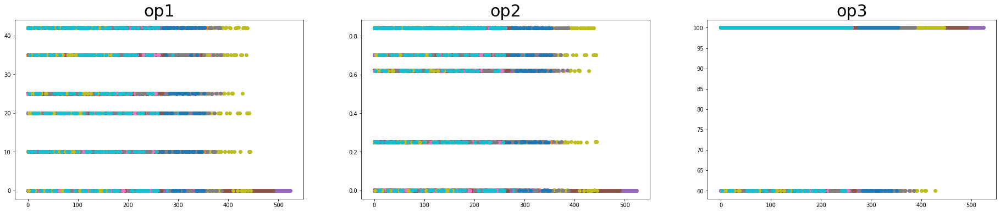

In [128]:
fig, ax = plt.subplots(1,3, figsize=(32,6))
for j in range(len(train)):
    #fig, ax = plt.subplots(1,3, figsize=(32,6))
    for i in range(100):
        #if (i+1) % 20 == 0:
        bool_mask = train[j]['unit number'] == (i+1)
        T = len(train[j][bool_mask].op1)
        t = np.arange(T)
        ax[0].scatter(t, train[j][bool_mask].op1)
        ax[0].set_title('op1', fontsize=30)
        
        ax[1].scatter(t, train[j][bool_mask].op2)
        ax[1].set_title('op2', fontsize=30)
        
        ax[2].scatter(t, train[j][bool_mask].op3)
        ax[2].set_title('op3', fontsize=30)
plt.show()

# Applying K-Means to [op1, op2]

In [ ]:
trains = pd.concat(train, axis = 0)
trains = trains.iloc[:,[2,3]]

tests = pd.concat(test, axis = 0)
tests = tests.iloc[:,[2,3]]

In [207]:
kmeans = KMeans(n_clusters=6, random_state=0).fit(trains)

predict_train = pd.DataFrame(kmeans.predict(trains))
predict_train.columns = ['predict']
predict_test = pd.DataFrame(kmeans.predict(tests))
predict_test.columns = ['predict']

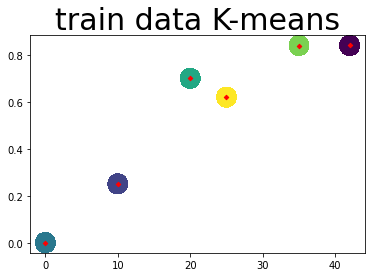

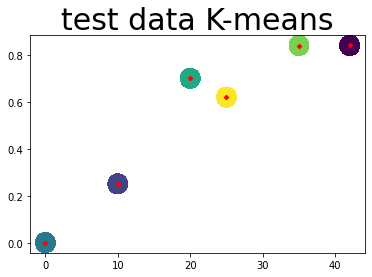

In [210]:
'''train data visualization'''
centers = pd.DataFrame(kmeans.cluster_centers_,columns=['op1','op2'])
center_x = centers['op1']
center_y = centers['op2']
plt.scatter(trains['op1'],trains['op2'],c=predict_train['predict'],alpha=0.5, s = 350)
plt.scatter(center_x,center_y,s=10,marker='D',c='r')
plt.title('train data K-means', fontsize=30)
plt.show()

'''test data visualization'''
centers = pd.DataFrame(kmeans.cluster_centers_,columns=['op1','op2'])
center_x = centers['op1']
center_y = centers['op2']
plt.scatter(tests['op1'],tests['op2'],c=predict_test['predict'],alpha=0.5, s = 350)
plt.scatter(center_x,center_y,s=10,marker='D',c='r')
plt.title('test data K-means', fontsize=30)
plt.show()

# Clustering Distribution

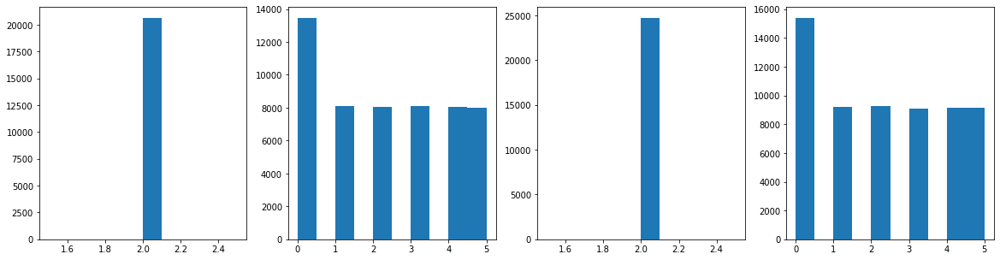

In [172]:
fig, ax = plt.subplots(1,4, figsize=(20,5))
for i in range(4):
    ax[i].hist(kmeans.predict(train[i].iloc[:,[2,3]]))
plt.show()

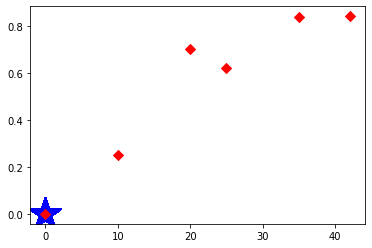

In [206]:
num = kmeans.predict(train[1].iloc[:,[2,3]])
bool_mask = (num == 2)
train[1][bool_mask]

train0 = kmeans.predict(train[0].iloc[:,[2,3]])
train1 = kmeans.predict(train[1].iloc[:,[2,3]])
train2 = kmeans.predict(train[2].iloc[:,[2,3]])
train3 = kmeans.predict(train[3].iloc[:,[2,3]])

bool_mask1 = (train1 == 2)
bool_mask3 = (train3 == 2)

new_train1 = train[1][bool_mask1]
new_train3 = train[3][bool_mask3]

plt.scatter(train[0]['op1'],train[0]['op2'], marker = '*', c='b', s = 1000)
plt.scatter(new_train1['op1'], new_train1['op2'], marker = '*', c='b', s = 1000)
plt.scatter(train[2]['op1'],train[2]['op2'], marker = '*', c='b', s = 1000)
plt.scatter(new_train3['op1'], new_train3['op2'], marker = '*', c='b', s = 1000)
#plt.scatter(center_x,center_y,s=50,marker='D',c='r')
#plt.scatter(train0[0])
plt.scatter(center_x, center_y, s = 50, marker = 'D', c = 'r')
plt.show()

In [ ]:

train[0]
train[2]
new_train1
new_train3

# training sensor  data by groupping unit number

4it [00:00,  6.49it/s]


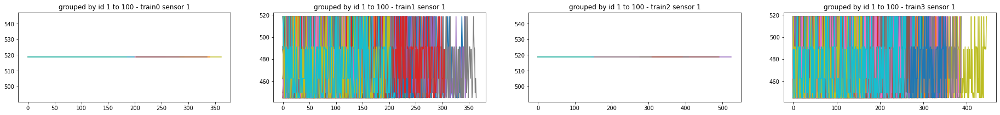

4it [00:00,  5.27it/s]


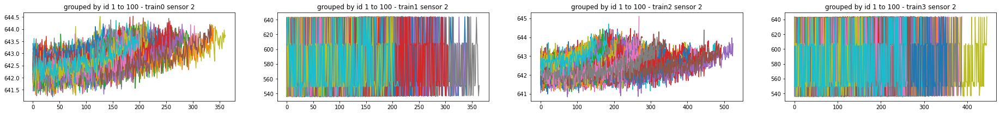

4it [00:00,  6.54it/s]


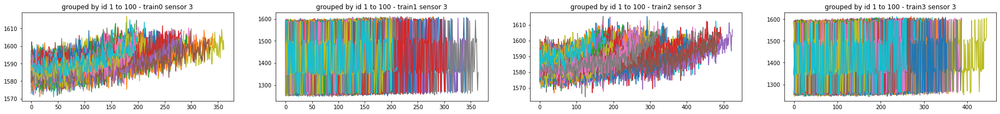

4it [00:00,  5.56it/s]


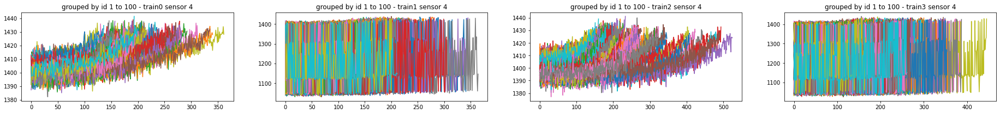

4it [00:00,  6.51it/s]


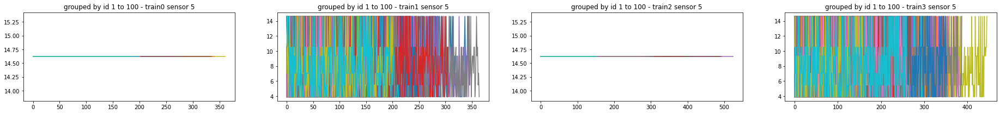

4it [00:00,  6.49it/s]


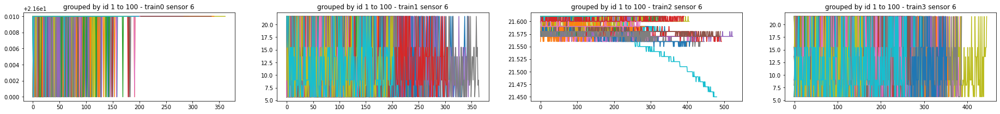

4it [00:00,  5.53it/s]


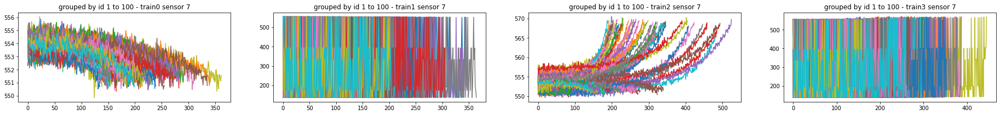

4it [00:00,  6.36it/s]


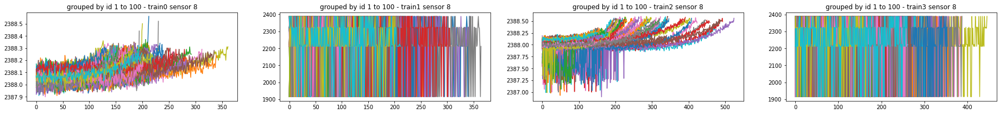

4it [00:00,  5.62it/s]


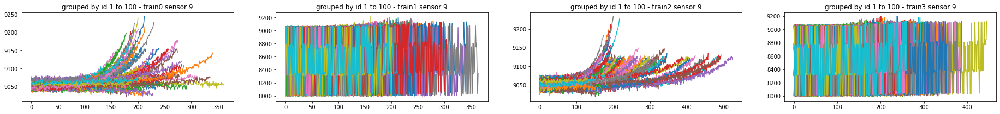

4it [00:00,  6.59it/s]


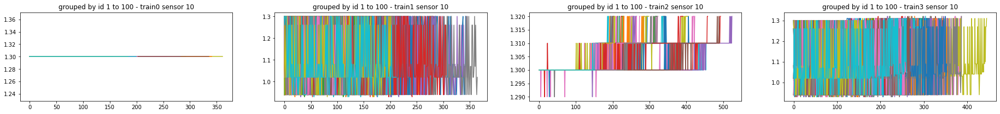

4it [00:00,  6.60it/s]


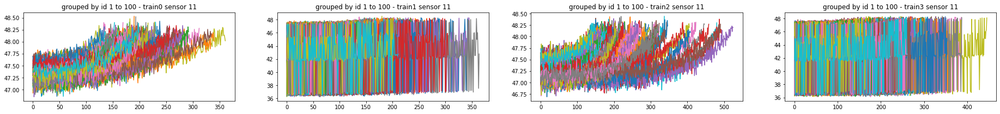

4it [00:00,  5.65it/s]


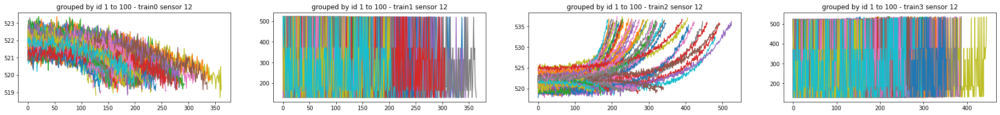

4it [00:00,  6.60it/s]


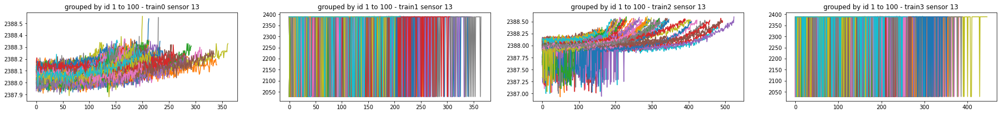

4it [00:00,  5.66it/s]


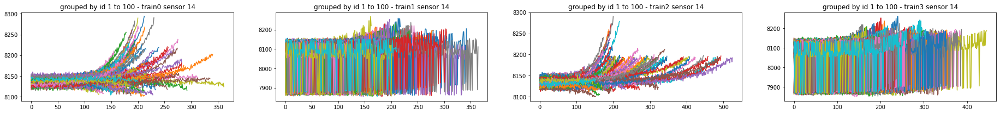

4it [00:00,  6.65it/s]


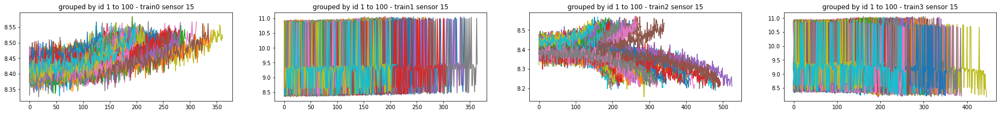

4it [00:00,  5.70it/s]


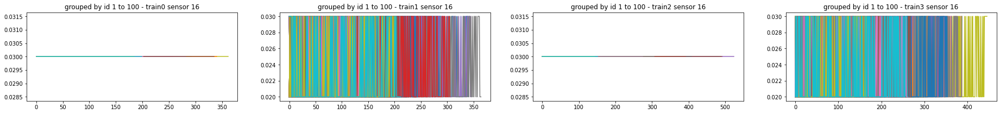

4it [00:00,  6.71it/s]


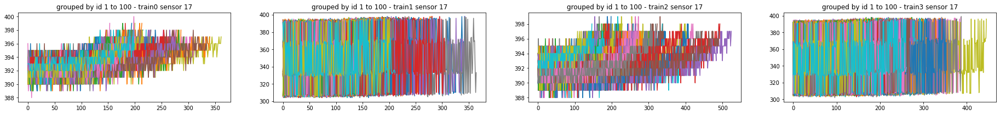

4it [00:00,  6.66it/s]


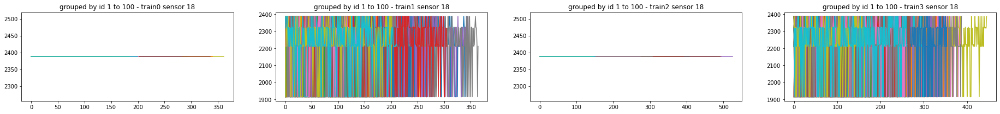

4it [00:00,  5.70it/s]


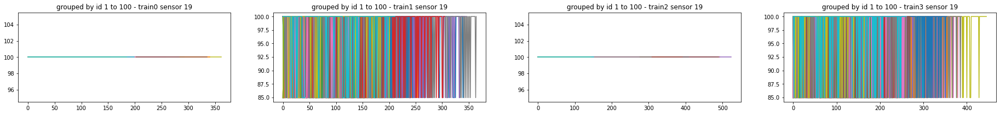

4it [00:00,  6.63it/s]


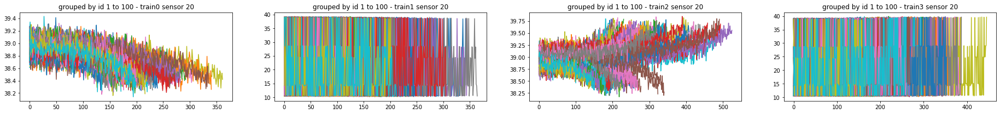

4it [00:00,  6.64it/s]


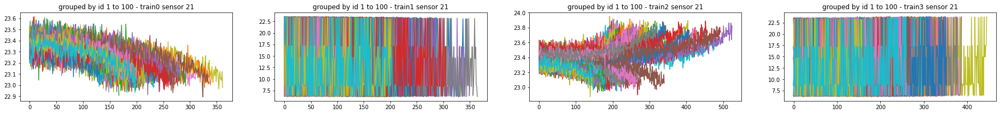

In [129]:
for name in (col_name[5:]):
    fig, ax = plt.subplots(1,4)
    fig.set_size_inches(32, 3)   
    for i, data in tqdm(enumerate(train)):
        for j in range(100):
            bool_mask = data['unit number'] == (j+1)
            T = len(data[bool_mask][name])
            t = np.arange(T)
            ax[i].plot(t, data[bool_mask][name])
            ax[i].set_title(f"grouped by unit number 1 to 100 - train{i} {name}")

    plt.show()

# test sensor data by groupping unit number

4it [00:00,  6.47it/s]


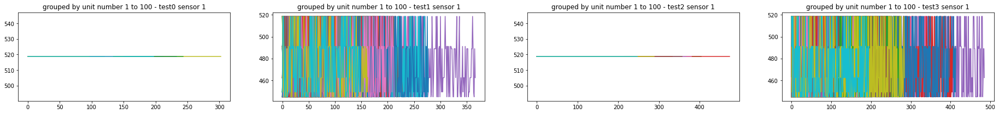

4it [00:00,  5.49it/s]


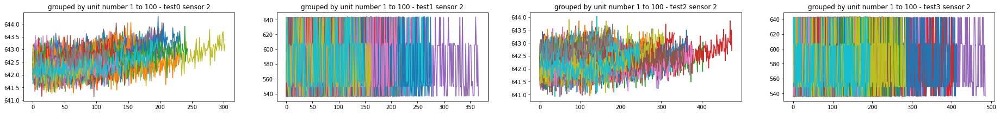

4it [00:00,  6.67it/s]


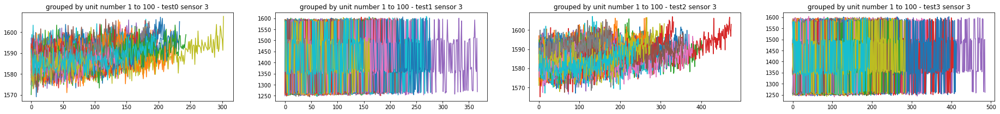

4it [00:00,  6.59it/s]


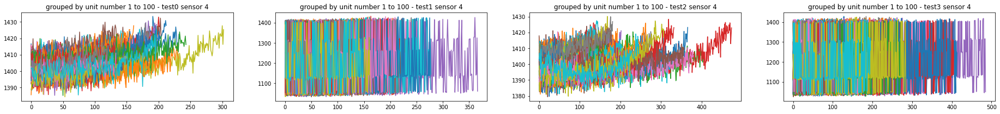

4it [00:00,  5.47it/s]


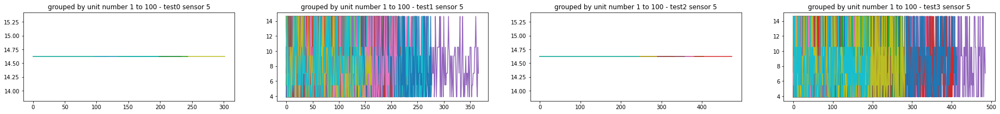

4it [00:00,  6.65it/s]


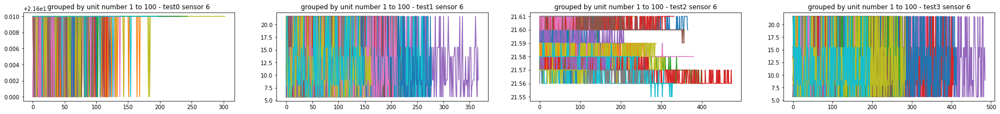

4it [00:00,  5.72it/s]


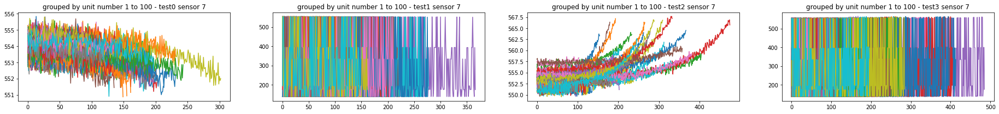

4it [00:00,  6.60it/s]


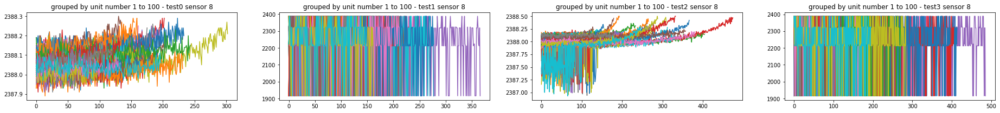

4it [00:00,  6.65it/s]


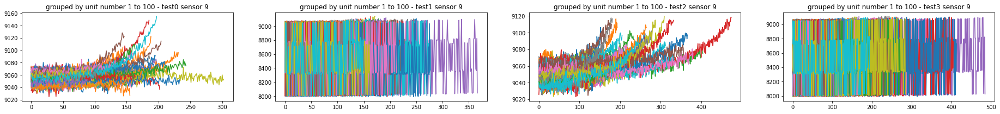

4it [00:00,  5.66it/s]


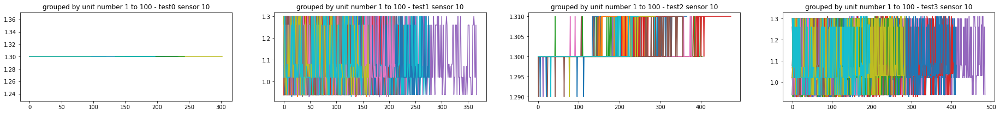

4it [00:00,  6.61it/s]


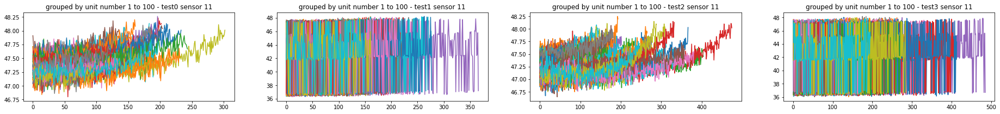

4it [00:00,  5.63it/s]


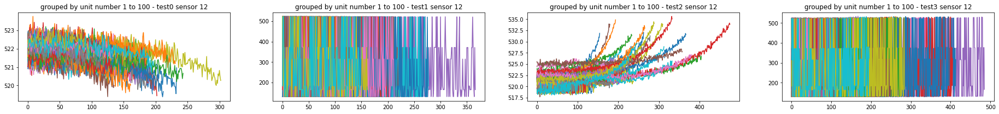

4it [00:00,  6.67it/s]


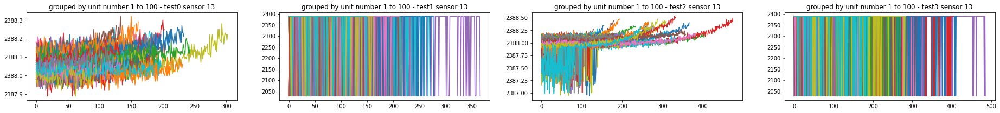

4it [00:00,  6.64it/s]


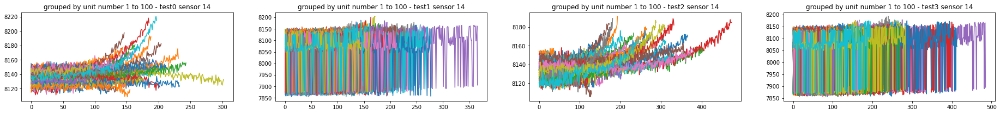

4it [00:00,  5.70it/s]


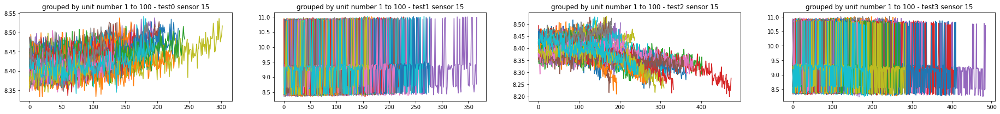

4it [00:00,  6.67it/s]


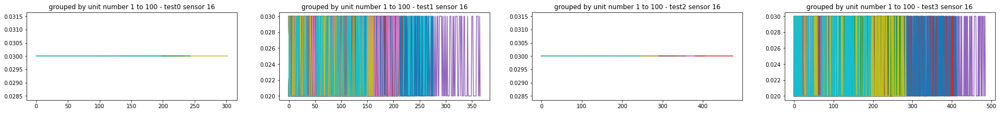

4it [00:00,  5.71it/s]


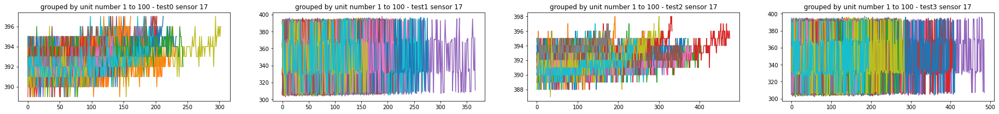

4it [00:00,  6.70it/s]


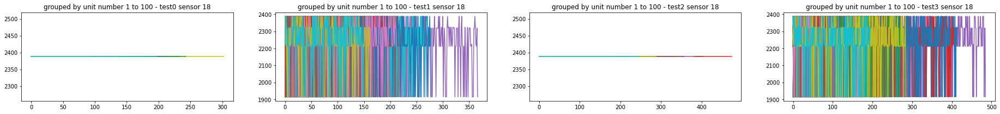

4it [00:00,  6.64it/s]


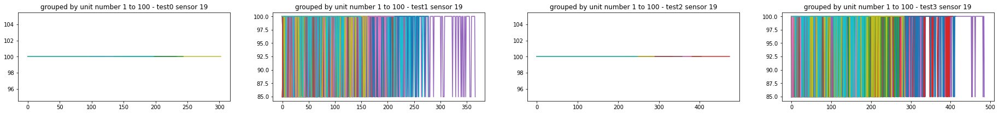

4it [00:00,  5.71it/s]


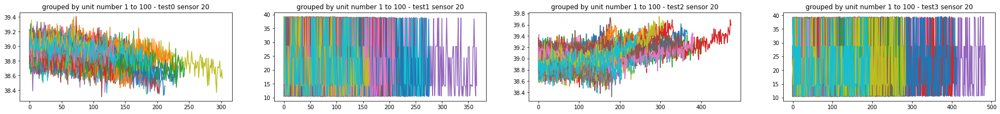

4it [00:00,  6.69it/s]


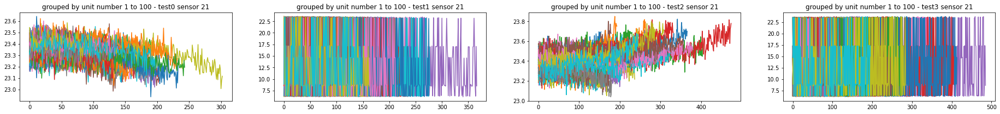

In [137]:
for name in (col_name[5:]):
    fig, ax = plt.subplots(1,4)
    fig.set_size_inches(32, 3)   
    for i, data in tqdm(enumerate(test)):
        for j in range(100):
            bool_mask = data['unit number'] == (j+1)
            T = len(data[bool_mask][name])
            t = np.arange(T)
            ax[i].plot(t, data[bool_mask][name])
            ax[i].set_title(f"grouped by unit number 1 to 100 - test{i} {name}")

    plt.show()

# FD001 unit number 1 1st data

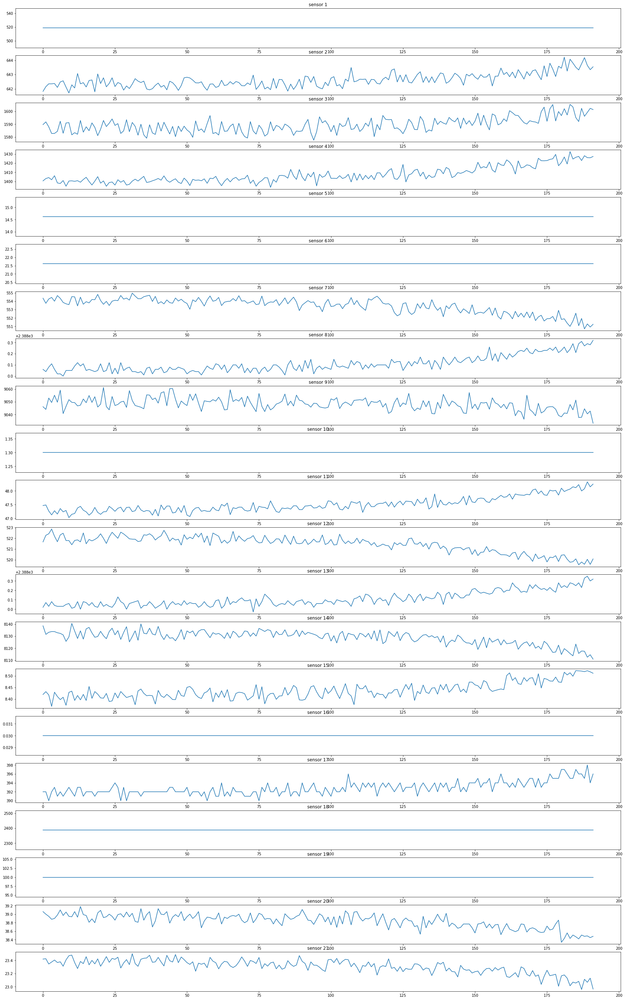

In [156]:
ojt_train = train[0].groupby('unit number').get_group(1)
ojt_train[col_name[5:]]

fig, ax = plt.subplots(21,1, figsize = (30,50))
for key, name in enumerate(col_name[5:]):
    ax[key].plot(ojt_train[name])
    ax[key].set_title(f"{name}")
plt.show()

0      641.82
1      642.15
2      642.35
3      642.35
4      642.37
        ...  
187    643.75
188    644.18
189    643.64
190    643.34
191    643.54
Name: sensor 2, Length: 192, dtype: float64

In [142]:
for key, data in enumerate(ojt_train[col_name[5:]]):
    print(data)

sensor 1
sensor 2
sensor 3
sensor 4
sensor 5
sensor 6
sensor 7
sensor 8
sensor 9
sensor 10
sensor 11
sensor 12
sensor 13
sensor 14
sensor 15
sensor 16
sensor 17
sensor 18
sensor 19
sensor 20
sensor 21


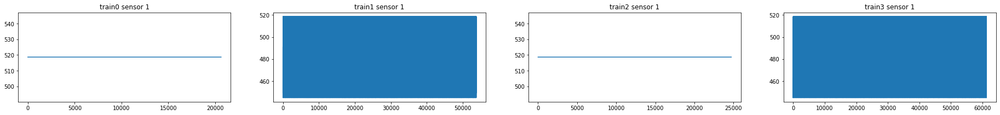

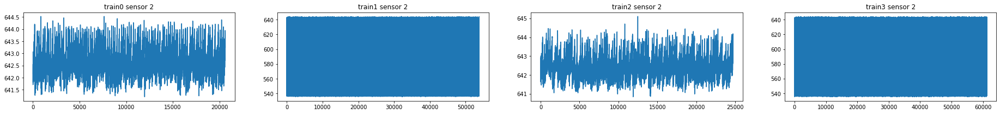

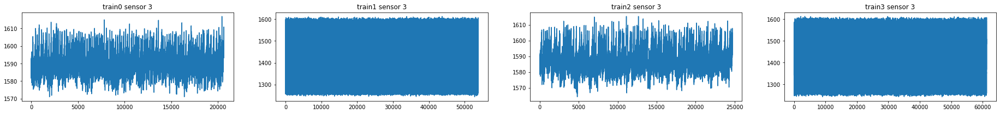

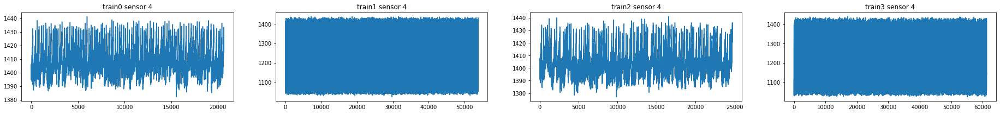

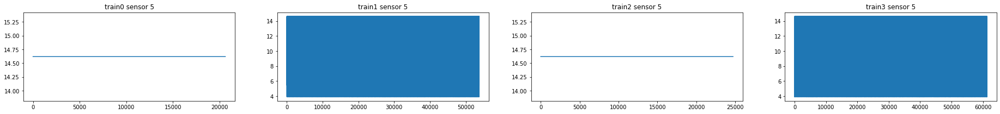

...

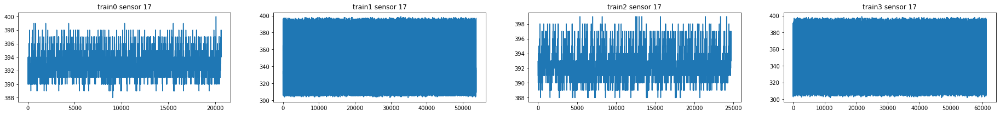

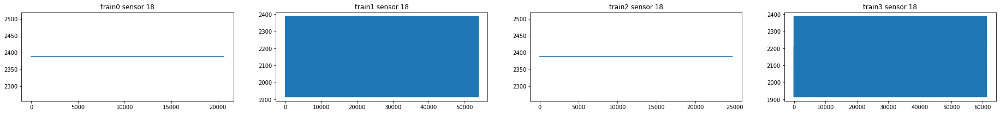

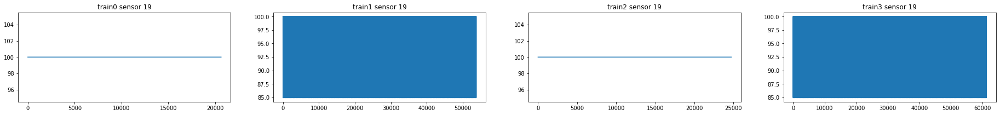

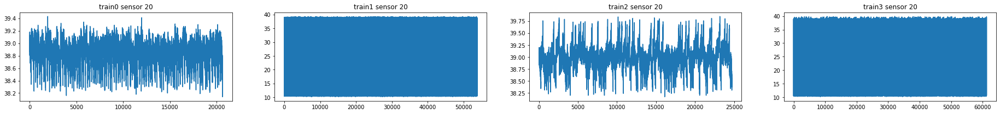

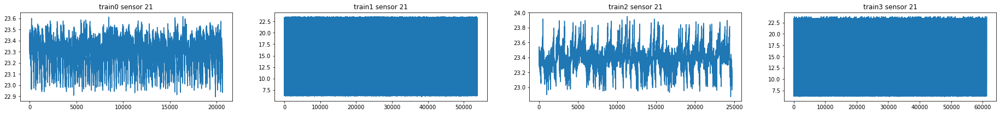

In [8]:
for name in col_name[5:]:
    fig, ax = plt.subplots(1,4)
    fig.set_size_inches(32, 3)
    for col, t in enumerate(train):           
        ax[col].plot(t[name])
        ax[col].set_title(f"train{col} {name}")

    plt.show()

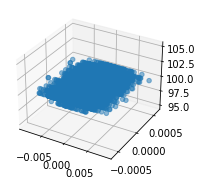

In [100]:
x = train[0].op1
y = train[0].op2
z = train[0].op3

fig = plt.figure(figsize=(3, 3))
ax = fig.add_subplot(111, projection='3d') # Axe3D object
#ax.plot(train[0].op1, train[0].op2, train[0].op3, alpha=0.6, marker='o')
ax.scatter(x, y, z, s= 20, alpha=0.5, cmap=plt.cm.Greens)
#ax.scatter(xs, ys, zs, c=color, marker='o', s=15, cmap='Greens')
#ax.view_init(90, 90)
plt.show()

# fig = plt.figure(figsize=(12, 6))
# ax = plt.axes(projection='3d')
# ax.contour3D(train[0].op1, train[0].op2, train[0].op3, 20, cmap=plt.cm.rainbow)

In [14]:
a = train[0].groupby('unit number')[col_name[5:]].std()
#train[0].groupby('unit number')(
a[col_name[5:]]

,sensor 1,sensor 2,sensor 3,sensor 4,sensor 5,sensor 6,sensor 7,sensor 8,sensor 9,sensor 10,...,sensor 12,sensor 13,sensor 14,sensor 15,sensor 16,sensor 17,sensor 18,sensor 19,sensor 20,sensor 21
unit number,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.486795,5.759776,8.565610,0.0,0.000000,0.910414,0.070914,4.911853,0.0,...,0.749176,0.076960,5.563129,0.034125,0.0,1.475661,0.0,0.0,0.166998,0.105101
2,0.0,0.560214,6.596730,9.737248,0.0,0.002491,0.940728,0.063001,12.491827,0.0,...,0.799368,0.063861,8.683012,0.041128,0.0,1.647280,0.0,0.0,0.199332,0.114796
3,0.0,0.474190,6.386222,8.610126,0.0,0.001482,0.733983,0.039957,35.196825,0.0,...,0.594788,0.041219,29.439715,0.036620,0.0,1.570773,0.0,0.0,0.166112,0.104734
4,0.0,0.441446,6.109152,7.737463,0.0,0.000727,0.708327,0.032530,36.571690,0.0,...,0.530158,0.034819,30.691780,0.031947,0.0,1.602848,0.0,0.0,0.159302,0.093804
5,0.0,0.551542,7.060648,9.782341,0.0,0.002503,0.895734,0.055522,21.404031,0.0,...,0.753298,0.056445,16.480153,0.038658,0.0,1.740057,0.0,0.0,0.187133,0.112705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0.0,0.501021,5.853261,8.791019,0.0,0.001086,0.864553,0.060982,6.994209,0.0,...,0.707257,0.060729,4.179830,0.035970,0.0,1.513053,0.0,0.0,0.180457,0.106394
97,0.0,0.473922,6.164926,7.668898,0.0,0.000993,0.671497,0.040905,40.436586,0.0,...,0.534132,0.036208,33.877407,0.034042,0.0,1.561475,0.0,0.0,0.170961,0.093300
98,0.0,0.525905,6.312261,9.751562,0.0,0.001378,0.898644,0.078068,5.040509,0.0,...,0.774711,0.074219,5.859512,0.035768,0.0,1.407692,0.0,0.0,0.177168,0.107449


In [42]:
a = train[0].groupby('unit number').get_group(1)
a

,unit number,time,op1,op2,op3,sensor 1,sensor 2,sensor 3,sensor 4,sensor 5,...,sensor 12,sensor 13,sensor 14,sensor 15,sensor 16,sensor 17,sensor 18,sensor 19,sensor 20,sensor 21
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,1,188,-0.0067,0.0003,100.0,518.67,643.75,1602.38,1422.78,14.62,...,519.79,2388.23,8117.69,8.5207,0.03,396,2388,100.0,38.51,22.9588
188,1,189,-0.0006,0.0002,100.0,518.67,644.18,1596.17,1428.01,14.62,...,519.58,2388.33,8117.51,8.5183,0.03,395,2388,100.0,38.48,23.1127
189,1,190,-0.0027,0.0001,100.0,518.67,643.64,1599.22,1425.95,14.62,...,520.04,2388.35,8112.58,8.5223,0.03,398,2388,100.0,38.49,23.0675
190,1,191,-0.0000,-0.0004,100.0,518.67,643.34,1602.36,1425.77,14.62,...,519.57,2388.30,8114.61,8.5174,0.03,394,2388,100.0,38.45,23.1295


4it [00:00,  6.57it/s]


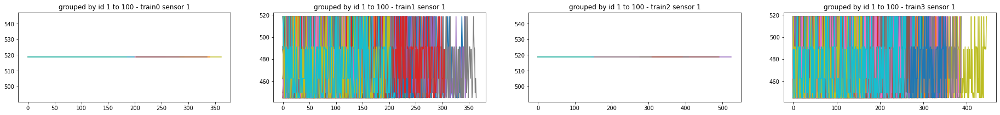

4it [00:00,  5.58it/s]


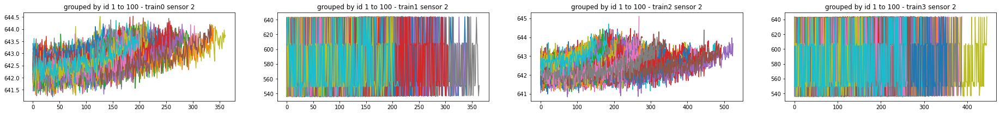

4it [00:00,  6.56it/s]


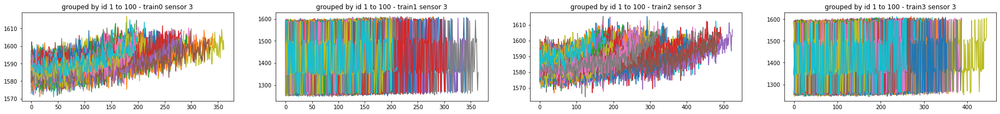

4it [00:00,  5.65it/s]


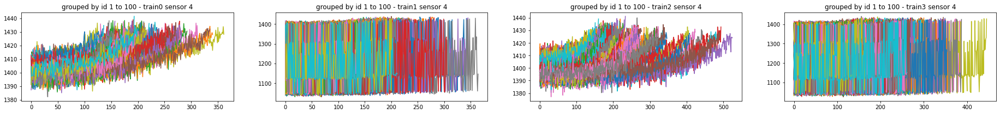

4it [00:00,  6.57it/s]


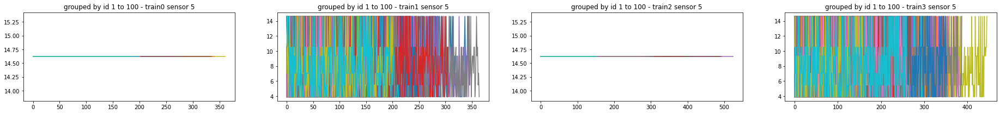

4it [00:00,  6.58it/s]


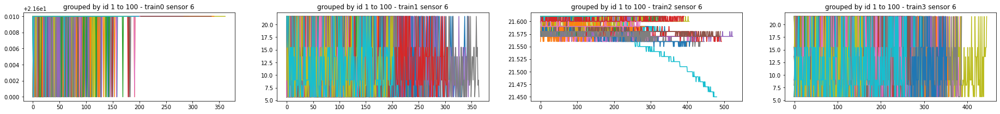

4it [00:00,  5.61it/s]


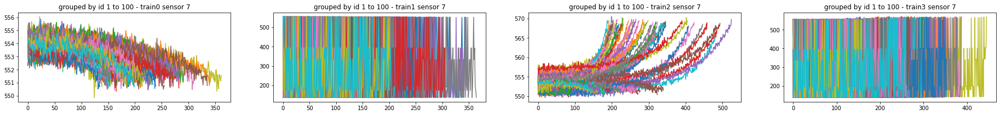

4it [00:00,  6.56it/s]


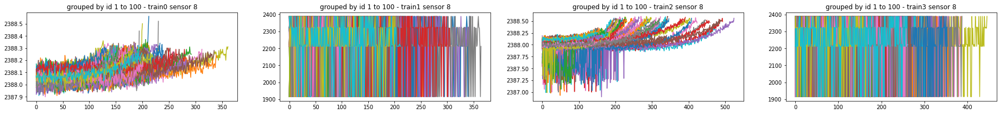

4it [00:00,  6.55it/s]


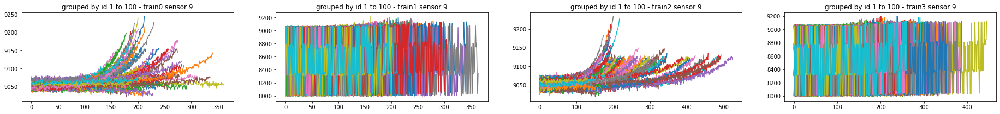

4it [00:00,  5.60it/s]


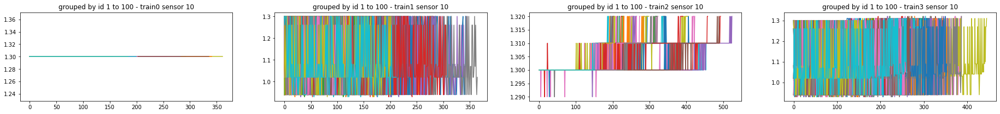

4it [00:00,  6.58it/s]


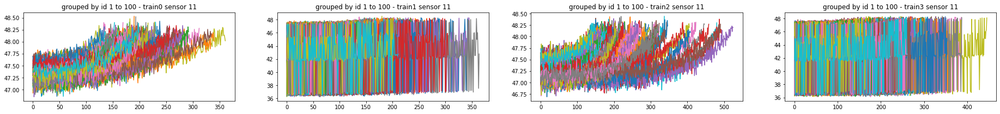

4it [00:00,  5.60it/s]


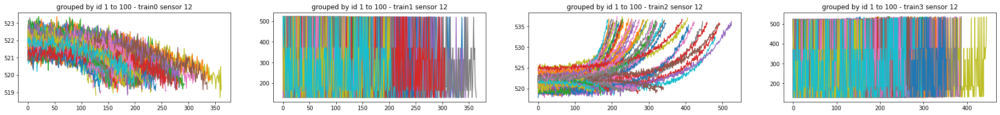

4it [00:00,  6.61it/s]


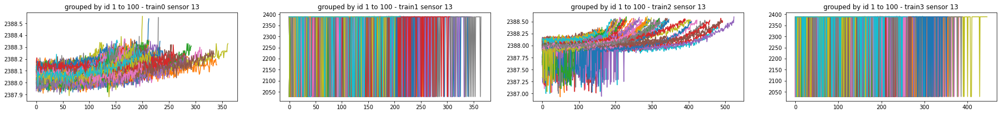

4it [00:00,  6.55it/s]


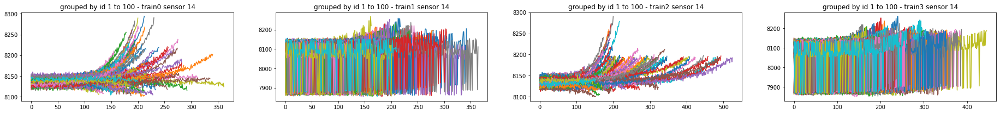

4it [00:00,  5.60it/s]


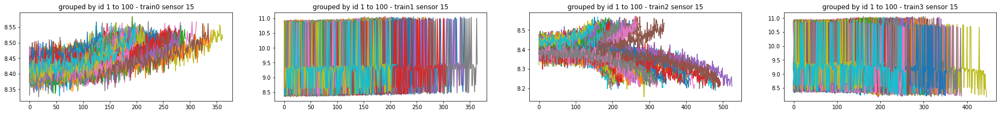

4it [00:00,  6.53it/s]


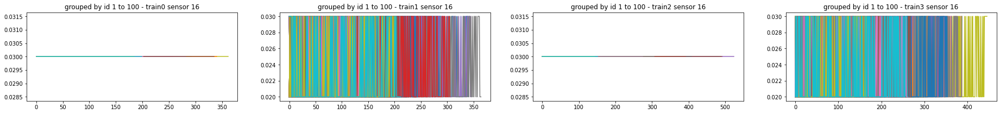

4it [00:00,  5.62it/s]


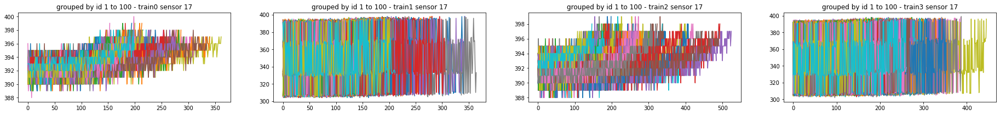

4it [00:00,  6.62it/s]


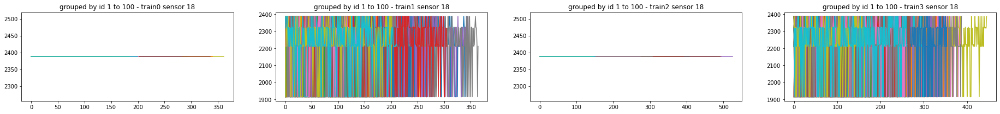

4it [00:00,  6.57it/s]


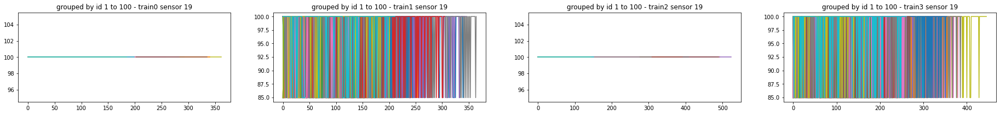

4it [00:00,  5.63it/s]


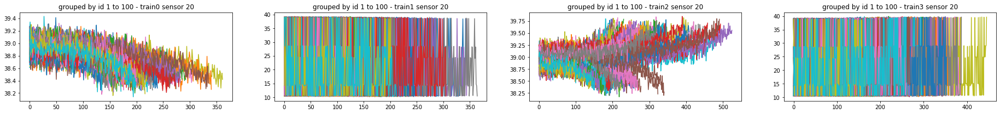

4it [00:00,  6.55it/s]


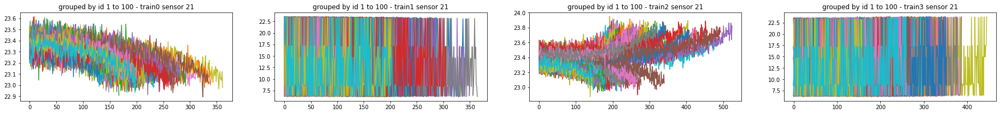

In [115]:
for name in (col_name[5:]):
    fig, ax = plt.subplots(1,4)
    fig.set_size_inches(32, 3)   
    for i, data in tqdm(enumerate(train)):
        for j in range(100):
            bool_mask = data['unit number'] == (j+1)
            T = len(data[bool_mask][name])
            t = np.arange(T)
            ax[i].plot(t, data[bool_mask][name])
            ax[i].set_title(f"grouped by id 1 to 100 - train{i} {name}")

    plt.show()